In [1]:
import pandas as pd

csv_severity = "CSV/plantvillage_with_severity_todo.csv"
df = pd.read_csv(csv_severity)

print("Total images:", len(df))
print("\nLabel counts (healthy vs diseased):")
print(df["label"].value_counts())
print("\nSeverity value counts (including healthy=0):")
print(df["severity"].value_counts(dropna=False))


Total images: 4799

Label counts (healthy vs diseased):
label
0    2539
1    2260
Name: count, dtype: int64

Severity value counts (including healthy=0):
severity
0.0    2539
NaN    2189
2.0      29
3.0      28
1.0      14
Name: count, dtype: int64


In [2]:
import math
import random
import matplotlib.pyplot as plt
from PIL import Image

def show_severity_grid(df, severity=1, n=12):
    """Show a grid of images with a given severity label."""
    subset = df[
        (df["severity"] == severity) &
        (df["for_severity_label"] == 1)
    ]

    print(f"Found {len(subset)} images with severity = {severity}")

    if len(subset) == 0:
        return

    sample = subset.sample(min(n, len(subset)), random_state=None)

    cols = 4
    rows = math.ceil(len(sample) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = axes.flatten()

    for ax, (idx, row) in zip(axes, sample.iterrows()):
        try:
            img = Image.open(row["image_path"]).convert("RGB")
        except Exception as e:
            ax.set_title(f"Error idx={idx}")
            ax.axis("off")
            continue

        ax.imshow(img)
        ax.set_title(f"idx={idx}", fontsize=8)
        ax.axis("off")

    # hide unused axes
    for ax in axes[len(sample):]:
        ax.axis("off")

    plt.suptitle(f"Severity {severity}", fontsize=14)
    plt.tight_layout()
    plt.show()


Found 14 images with severity = 1


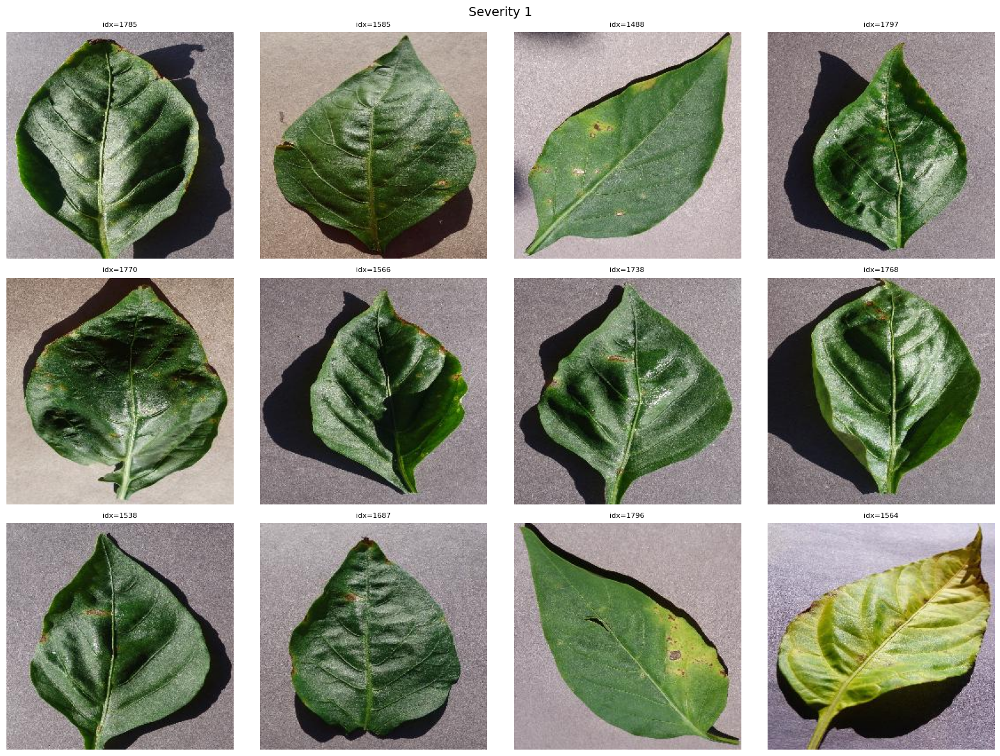

Found 29 images with severity = 2


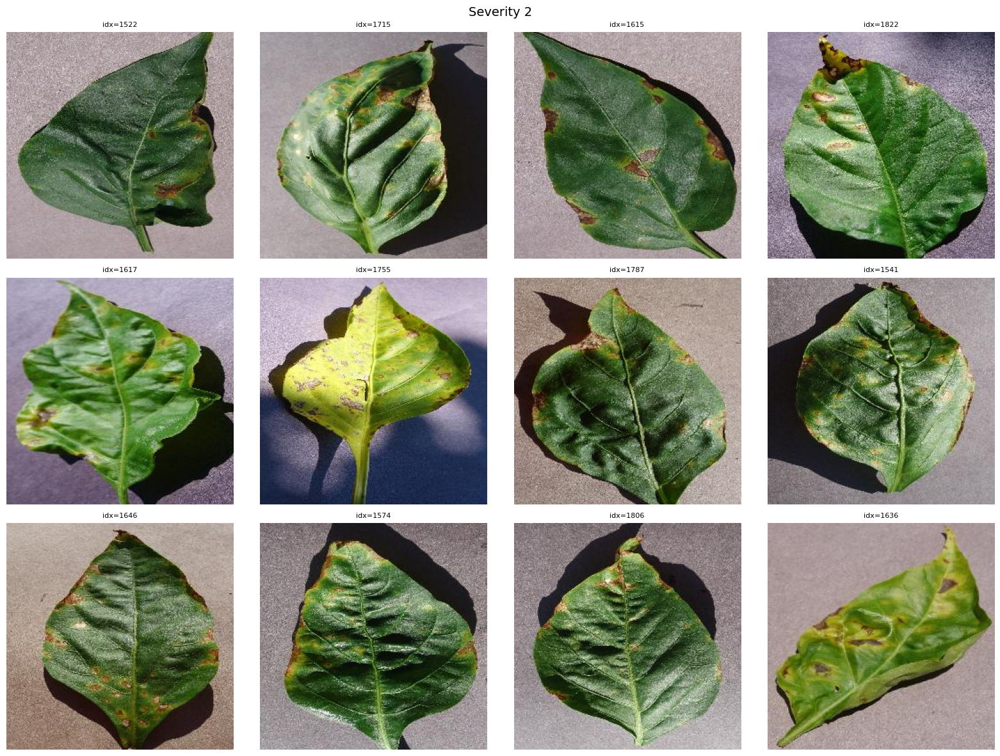

Found 28 images with severity = 3


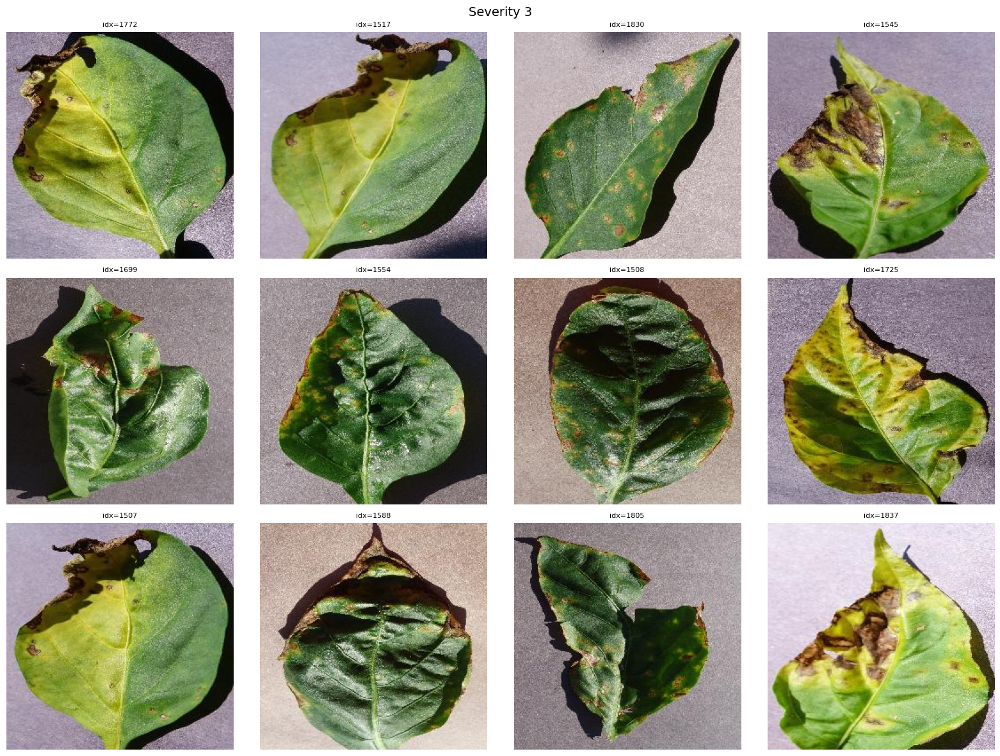

In [3]:
show_severity_grid(df, severity=1, n=12)  # mild / early stress
show_severity_grid(df, severity=2, n=12)  # moderate
show_severity_grid(df, severity=3, n=12)  # severe


In [4]:
import matplotlib.pyplot as plt
from PIL import Image

def edit_one_image_severity(df, idx):
    """Show one image and allow changing its severity label."""
    if idx not in df.index:
        print(f"Index {idx} not found in dataframe.")
        return df

    row = df.loc[idx]

    print(f"\nEditing idx={idx}")
    print(f"Path: {row['image_path']}")
    print(f"Current label (healthy/diseased): {row['label']}")
    print(f"Current severity: {row['severity']}")

    # show image
    try:
        img = Image.open(row["image_path"]).convert("RGB")
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"idx={idx}, current severity={row['severity']}")
        plt.show()
    except Exception as e:
        print(f"Error loading image: {e}")
        return df

    print("Severity scale:")
    print("0 = healthy")
    print("1 = mild / early stress")
    print("2 = moderate")
    print("3 = severe")
    print("(Press Enter with no input to keep the current value.)")

    new_s = input("New severity (0,1,2,3 or blank to keep): ").strip()

    if new_s == "":
        print("Keeping existing severity.")
        return df

    if new_s not in ["0", "1", "2", "3"]:
        print("Invalid input, no change made.")
        return df

    df.at[idx, "severity"] = int(new_s)
    print(f"Updated idx={idx} to severity {new_s}")
    return df


In [5]:
# interactive edit loop

while True:
    print("\nType a dataframe index to edit, or 'q' to quit.")
    user_input = input("Index to edit (or q): ").strip().lower()

    if user_input == "q":
        print("Saving CSV and exiting edit mode.")
        df.to_csv(csv_severity, index=False)
        break

    if not user_input.isdigit():
        print("Please enter a numeric index or 'q'.")
        continue

    idx = int(user_input)
    df = edit_one_image_severity(df, idx)

    # auto save after each edit if you want
    df.to_csv(csv_severity, index=False)
    print("Progress saved.")



Type a dataframe index to edit, or 'q' to quit.
Saving CSV and exiting edit mode.
